In [2]:
import re

import pod5
import pysam
import numpy as np
import pandas as pd
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

from remora import io, refine_signal_map, util

### Data and Level Table Loading

In [3]:
# data locations

# default data
#can_pod5_path = "/Users/pracheetishikarkhane/Documents/remora/tests/data/can_reads.pod5"
#can_bam_path = "/Users/pracheetishikarkhane/Documents/remora/tests/data/can_mappings.bam"

# glyphic data
can_pod5_path = "/Users/pracheetishikarkhane/Documents/pod5_output_9EFGW/output.pod5"
#can_pod5_path = "/Users/pracheetishikarkhane/Documents/pod5_output_32YWD/output.pod5"


#can_bam_path = "/Users/pracheetishikarkhane/Documents/dorado-0.3.1-osx-arm64/output/9_4_1/9_4_1_moves.bam"
can_bam_path = "/Users/pracheetishikarkhane/Documents/dorado-0.3.1-osx-arm64/output/9EFGW/9_4_1/with_reference/test_sorted.bam" # created with dorado aligner
#can_bam_path = "/Users/pracheetishikarkhane/Documents/dorado-0.3.1-osx-arm64/output/9_4_1/9_4_1_sorted_reference.bam" # created with the reference tag
#can_bam_path = "/Users/pracheetishikarkhane/Documents/dorado-0.3.1-osx-arm64/output/32YWD/r10_260bps_calls_moves_align.bam"

# default data
#mod_pod5_path = "/Users/pracheetishikarkhane/Documents/remora/tests/data/mod_reads.pod5"
#mod_bam_path = "/Users/pracheetishikarkhane/Documents/remora/tests/data/mod_mappings.bam"



can_pod5_fh = pod5.Reader(can_pod5_path)
can_bam_fh = pysam.AlignmentFile(can_bam_path, check_sq = False)
#mod_pod5_fh = pod5.Reader(mod_pod5_path)
#mod_bam_fh = pysam.AlignmentFile(mod_bam_path)

level_table = "/Users/pracheetishikarkhane/Documents/remora/tests/data/levels.txt"
sig_map_refiner = refine_signal_map.SigMapRefiner(
    kmer_model_filename=level_table,
    scale_iters=0,
    do_fix_guage=True,
)


#iter = can_bam_fh.fetch("seq1", 10, 20)
#for x in iter:
#    print(str(x))

    
#bf = pysam.AlignmentFile(fname, "rb")
#print(Iterators.size(can_bam_fh.fetch()))
#for r in can_bam_fh.fetch():
    #print(str(r))
    #assert not r.is_unmapped
    
#fetch returns an AlignedSegment type object
i = 0
for r in can_bam_fh.fetch(until_eof=True):
    if i < 100:
        strR = r.to_string()
        splitR = strR.split("\t")
        print(splitR[0])
        print(r.query_sequence)
        #print(io.Read.query_to_signal)
        #mdstring = r.get_tag('MD')
        #print(mdstring)
        #io.Read.add_alignment(r, True, False).query_to_signal
        #print(r.get_reference_sequence())
        i+=1
    else:
        break

00190750-044a-41c3-a224-130285ba3683
None
0013497d-4c3f-4646-945b-75ddbe0c89c6
None
000f28c5-d70e-4d7b-9141-4c23fcb3f2f5
None
0014b9cd-2fc8-425d-80dc-114eac923614
None
000c934f-2ab9-490b-bf72-8cfa79fdde8e
None
0022bbd1-cb59-40c6-b61a-d07ef5d6a3a4
None
0015291c-7ea8-4aed-92d9-4390f470ad52
None
001a4db7-278a-4201-8e97-b537c985babc
None
0015cc5d-f29c-42f3-8660-8b0277f09062
CCTTACTTCGTTCAGTTACGTATTGCTTTTCTCTTCTCCCTCTCTTTCTCTCTCTCTTTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTTTCTTCTTCTTCTCCCTCCTCCCTCCCTCTTTCTTTCTCTCTCTCTCTCTCTCTCTCCCTTTCTCCCTCCCTCTCCCTTACAGAAGTCTCCACGTAAATTACGTGTATATTACATCCACGGAGTCTTTCAATACACA
00220219-7a6f-4f6f-b08e-26603c0c4ebf
None
00295210-7960-4a09-9a8a-9042cf4bb001
None
002a65a2-38d9-4747-a7bc-3768d13971e3
None
0023ab1c-0bb8-4dcd-9504-2b1cb6126a2d
TTAAATCATAGCCACTTCGTTCAGTTACGTATTACTTTTCTCTTCTCCCTCTCTTTCTCTCTCCCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTTTCTTCTTCTTCTCCCTCCTCCCATATAACACTTTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCCCCTTTCTCCCTCCCTCTCCCTTACTGAAGTCTCACGCTAAATTGCGTGCCTGTCCCTTCC

### Basecall-anchored Metrics

error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
RefRegion(ctg='Seq_B1', strand='+', start=0, end=200)
Read(read_id='020e7e19-d3e2-4f88-a2f6-fb30b6dd5f06', dacs=array([635, 669, 574, ..., 513, 506, 708], dtype=int16), seq='CTTGTACTTCGTTCAGTTTGCATGTGCTTTCTCTTCTCCCTCTCTTTCTCTTTCCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTTTCTTCTTCTCCCTCTCCCTCCCTCTCTTTCTCTCTCTCTCTCTCTCTCCCTTTCACTCCCTCGTGCAGAGTCTCACGTAGTACGTGTATTACATCCACGAGGTCTTTCCTTTCT', stride=5, num_trimmed=50, mv_table=array([1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 1, 0,

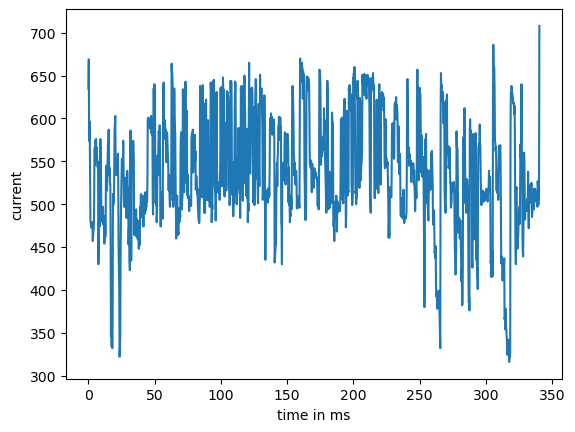

020e7e19-d3e2-4f88-a2f6-fb30b6dd5f06
202
1362
RefRegion(ctg='Seq_B1', strand='+', start=0, end=189)
Read(read_id='01f9b31a-46ea-47c8-93c8-21a52e367ded', dacs=array([698, 692, 658, ..., 450, 466, 456], dtype=int16), seq='TATTACTTCGTTCAGTTACGTATTGCTTTTCTCTTCTCCCTCTCTTTCTCTCTTTCCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTTTCTTCTTCTTCCTCCCTCCCTCTTTCTTTCTCTCTCTCTCTCTCTCTCTCTCTCCCTTTCTCCCTCCCTCTCCCTTACTGAAGTCTCACGTAAATTACGTGTATATTACATCACTGATACTCATATA', stride=5, num_trimmed=130, mv_table=array([1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0,
       1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1,
       1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0,
       1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1,
       0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0,
       1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0,
       0, 

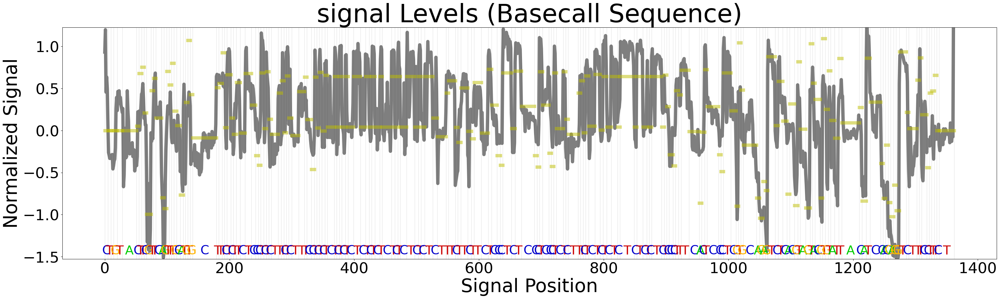

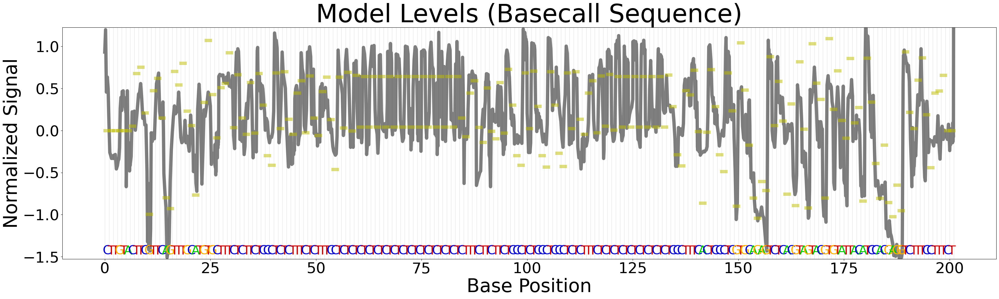

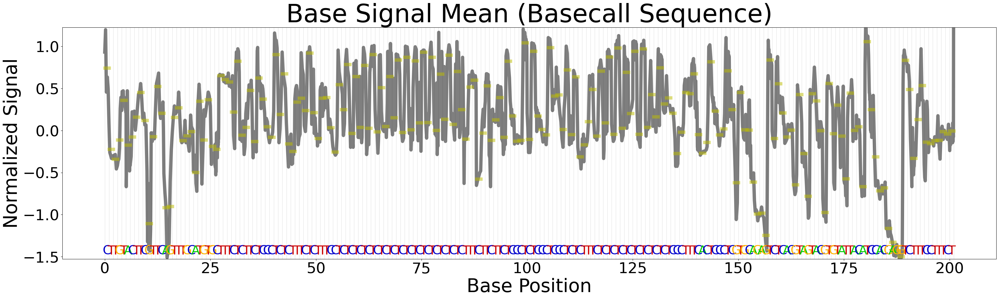

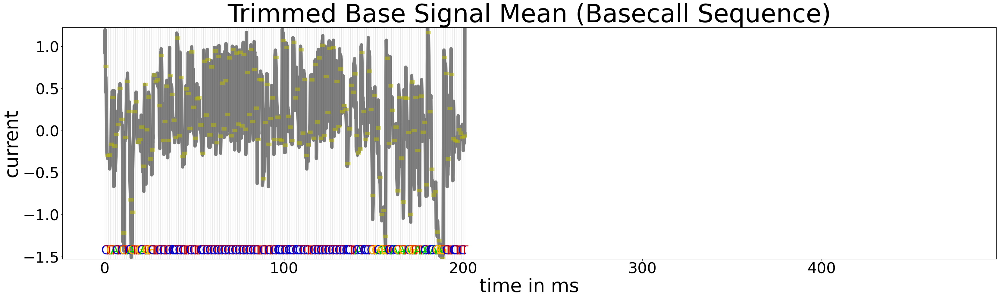

01f9b31a-46ea-47c8-93c8-21a52e367ded
221
1896
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
RefRegion(ctg='Seq_B1', strand='+', start=0, end=186)
Read(read_id='0226bf30-53c2-4dc0-b69d-51f043cbd6db', dacs=array([466, 399, 468, ..., 439, 449, 595], dtype=int16), seq='TGTACTTCGTTCAGTTACATTATTACTTTCTCTTCTCCCTCTCTTTCTCTCTTTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTTTCTCTCTTTCTTCTTCTTCTCCCTCCTCCCCTCCCTCTTTCTTTCTCTCTCTCTCTCTCTCTCTCTCCCTTTCTCCCTCCCACTCACTCCCTTGCAAACTCTCACATAAATTACGTGTATATTACT', stride=5, num_trimmed=210, mv_table=array([1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0,
       1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 

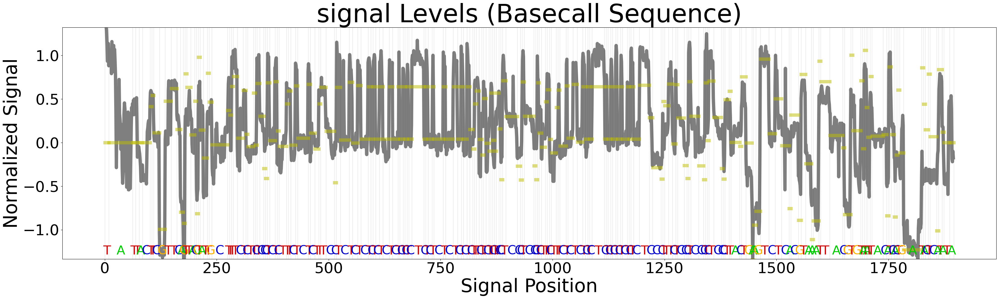

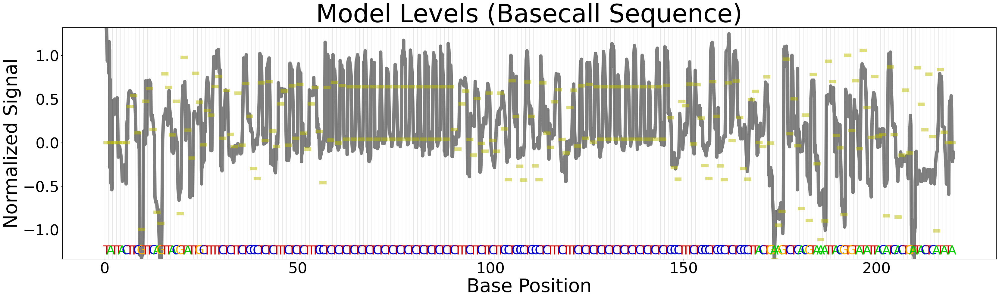

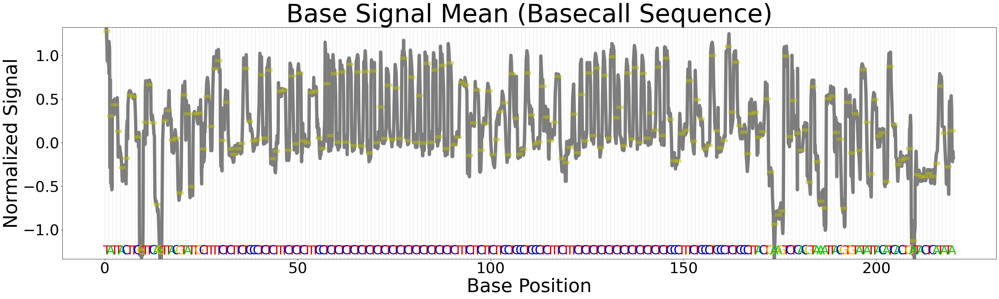

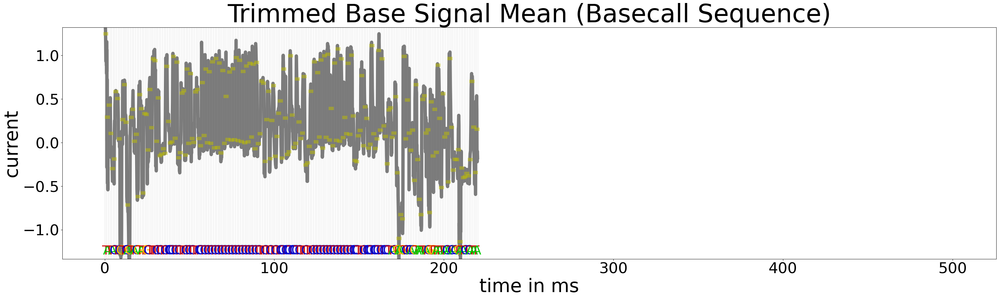

0226bf30-53c2-4dc0-b69d-51f043cbd6db
214
2004
error in pod5 alignment
RefRegion(ctg='Seq_B1', strand='+', start=0, end=304)
Read(read_id='0218994a-9872-4c90-8d6b-67ad8e3e9769', dacs=array([477, 471, 484, ..., 483, 491, 824], dtype=int16), seq='TCACTTGTACTTCGTTCAGTTACGTATTACTTTTTCTCTTCTCCCTCTCTTTCTCTCTTTCCCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTTTCTTCTTCTTCTCCCTCCTCCCTCCCTCTTTCTTTCTCTCTCTCTCTCTCTCTCTCCCTTTCTCTCCCTCTCCTTACTGGTTATCTCACGTAAATACGTGTATATTACATCCACAGTTCTTGTACATATCCTTCGACCATATAAATGTTTTGATGGAGAGTAAGACGGCCCAGGTCGCATCGTCGCCCACAAACCGGCCTTACACATACA', stride=5, num_trimmed=10, mv_table=array([1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1,
       0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1,
       0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 

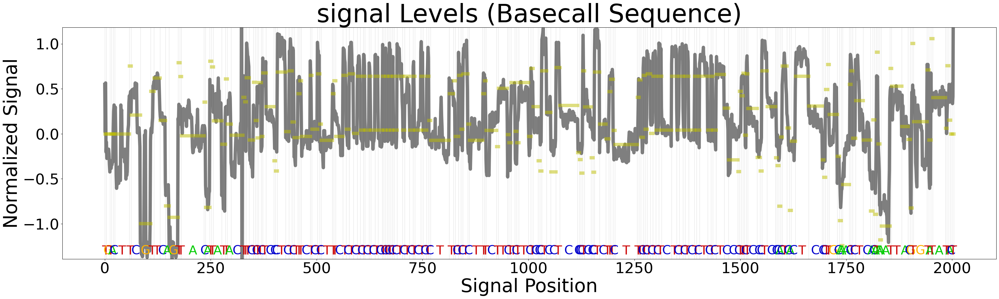

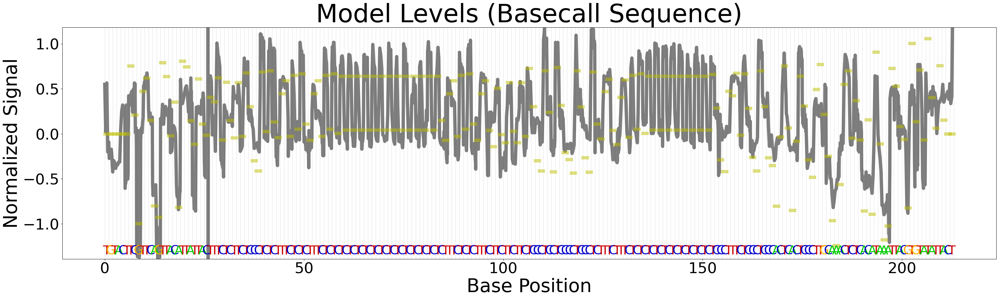

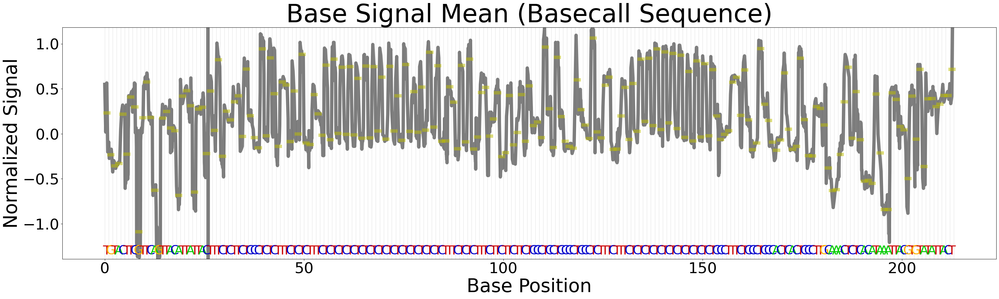

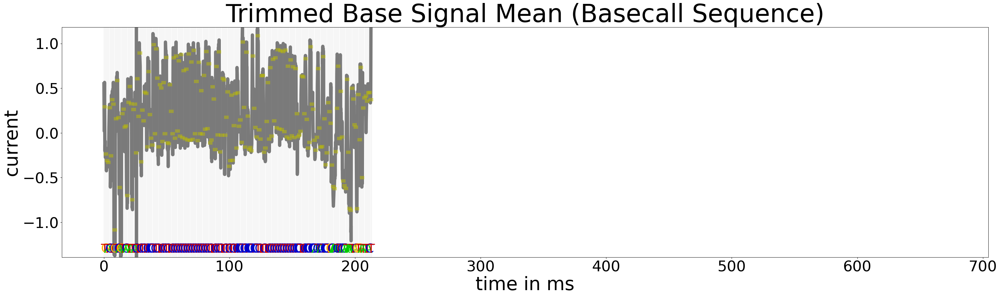

0218994a-9872-4c90-8d6b-67ad8e3e9769
301
2590
error in pod5 alignment
error in pod5 alignment
RefRegion(ctg='Seq_B1', strand='+', start=0, end=203)
Read(read_id='0235fc35-4f6c-42cb-824c-2c4ea141fc4d', dacs=array([530, 528, 563, ..., 846, 816, 796], dtype=int16), seq='TATTACTTCGTTCAGTTACGTATTACTTTCTCTTCTCCCTCTCACCTCTCTTCCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTTTCTTCTTGCTTACCTTCTCTCACCATCTCTTTCTTTCTCTCTCTCTCTCTCTCTCTCTCCCTTTCTCCTACCTCCCTCTCCCTTACACAAGTCTCACGTAAATTACGTGTATATTACATCCACGAGGGTCTTCATCTT', stride=5, num_trimmed=130, mv_table=array([1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1,
       0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 0, 1, 0, 1, 

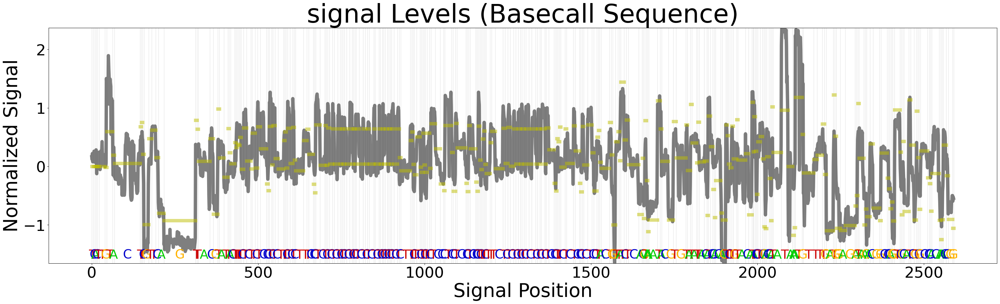

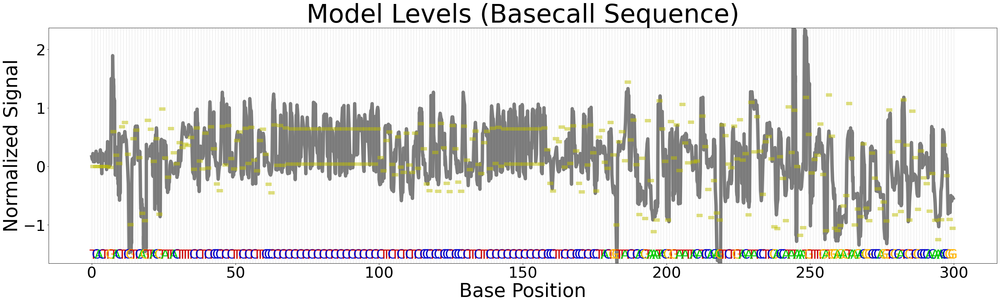

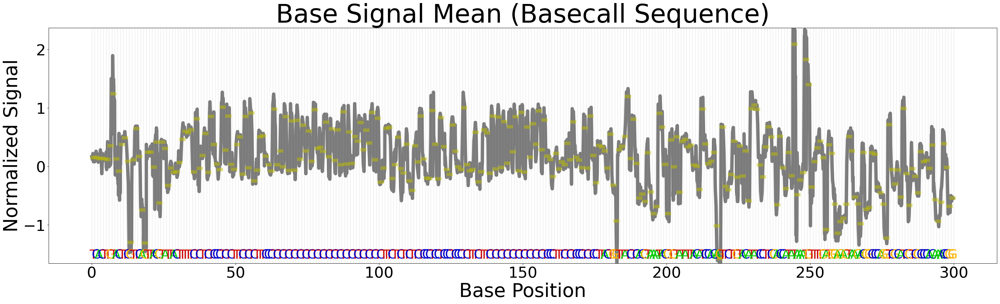

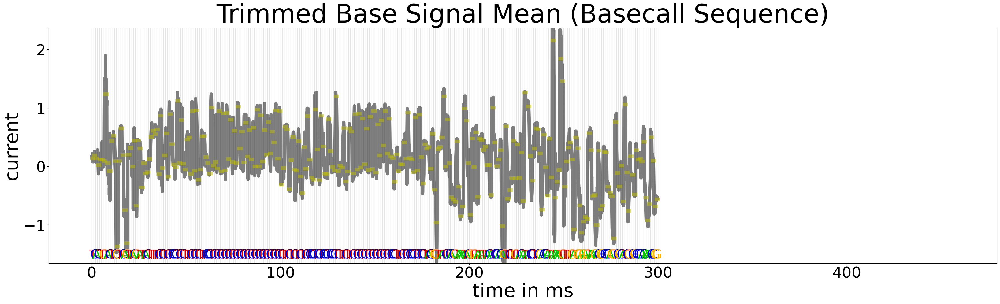

0235fc35-4f6c-42cb-824c-2c4ea141fc4d
231
1828
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
RefRegion(ctg='Seq_B1', strand='+', start=0, end=94)
Read(read_id='0287f9fa-c00f-4042-9346-e80730ac5e38', dacs=array([466, 467, 472, ..., 471, 469, 485], dtype=int16), seq='GAACTCATACTTCGTTCAGTTACGTATTGCTTTCTCTTCTCCCTCTCTTTCTCTCTTTCCCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTTTCTTCTTCTCCTCCTCCTCCTCTTAATA', stride=5, num_trimmed=10, mv_table=array([1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1,
       1, 1

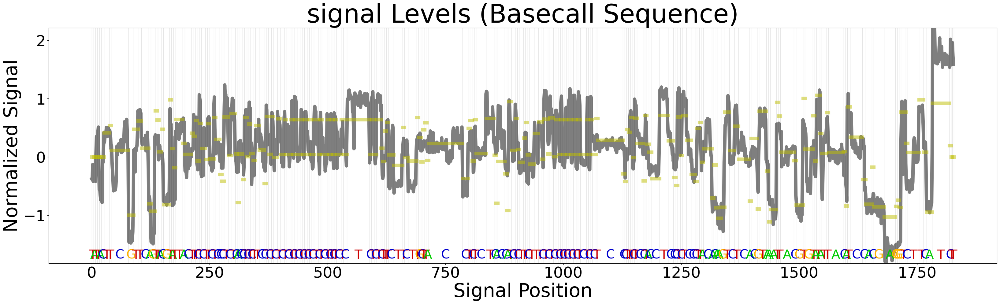

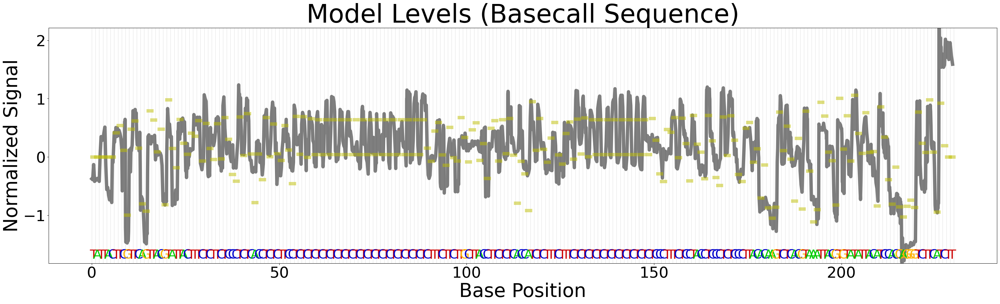

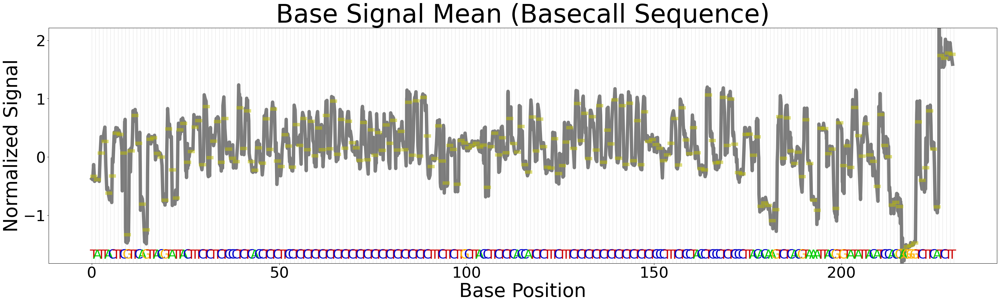

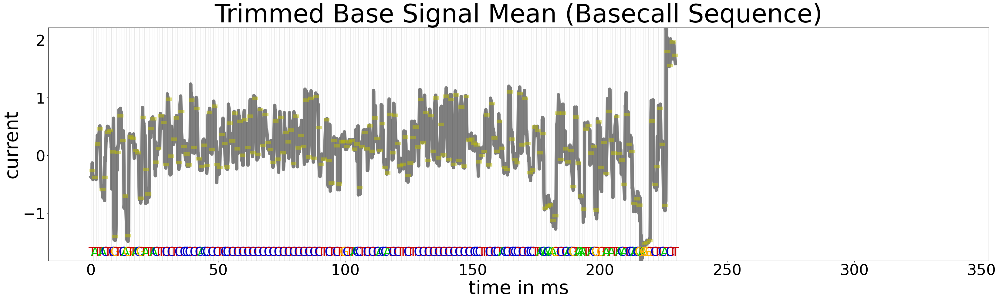

0287f9fa-c00f-4042-9346-e80730ac5e38
130
1345
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
RefRegion(ctg='Seq_B1', strand='+', start=0, end=301)
Read(read_id='02b4584c-d3be-46d2-b238-f210105497d1', dacs=array([764, 744, 770, ..., 584, 578, 574], dtype=int16), seq='AGCAGCCTTCGTTCAGTTACATGTTACTTTTCTCTTCTCCCTCTCTTTCTCTCTTTCCCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTTTCTTCTTCTTCTCCCTCCTCCCTCCCTCTTTCTTTCTCTCTCTCTCTCTCTCTCTCTCCCTTTCTCCCTCCCTCTCCCTTACTGAAGTCTCACAGTGGGATACGTGTATTACATCCGAGGTCTTCAGCAGTTCATCCTTCTGACCATCACGCCCTGGTGCCTGGTGCGCCCCACGATGGAAGGGTAAGACGGCCAGGGTCGCATCGTCGCCCGCGAGCCGGCCTTGCATCC', stride=5, num_trimmed=90, mv_table=array([1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1,
       1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 

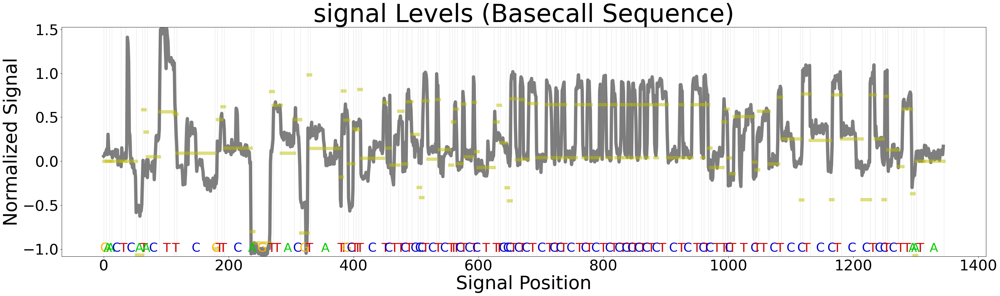

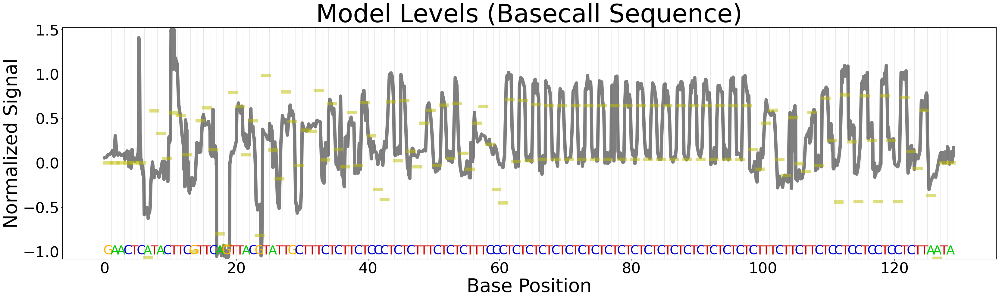

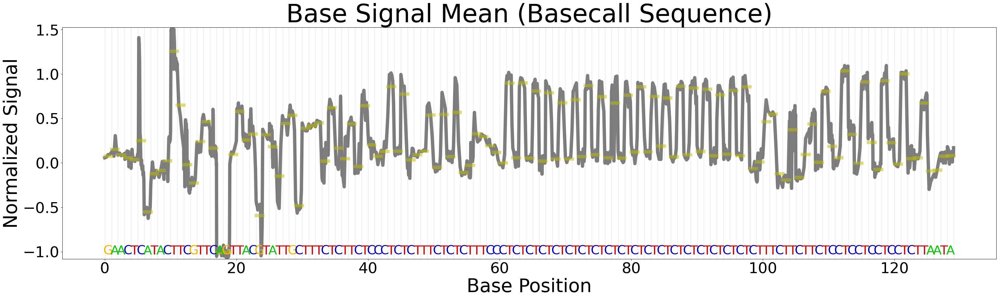

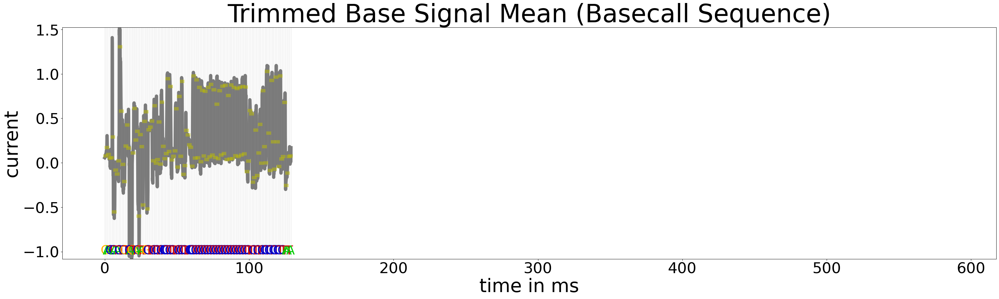

02b4584c-d3be-46d2-b238-f210105497d1
301
2177
RefRegion(ctg='Seq_B1', strand='+', start=0, end=143)
Read(read_id='02a14200-6f17-4d5e-8a2f-885fe658a797', dacs=array([520, 561, 634, ..., 582, 639, 936], dtype=int16), seq='TGTACTTCGTTTCAGTTACATTATTCTTTTCTCTTCTCCCTCTCTTTCTCTCTTTCCCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTTCTTCTTTCTCCCTCCTCCCTCCCTCTTTCTTTCTCTCTCTCTCTCTCTCTCTCTCCCTTTCTCCCTCTG', stride=5, num_trimmed=130, mv_table=array([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1,
       0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0

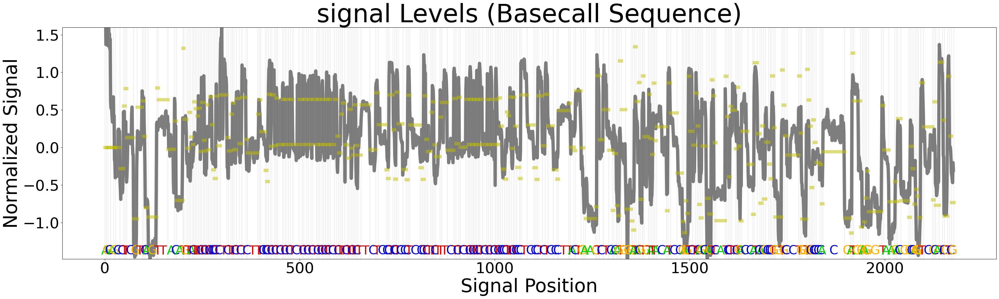

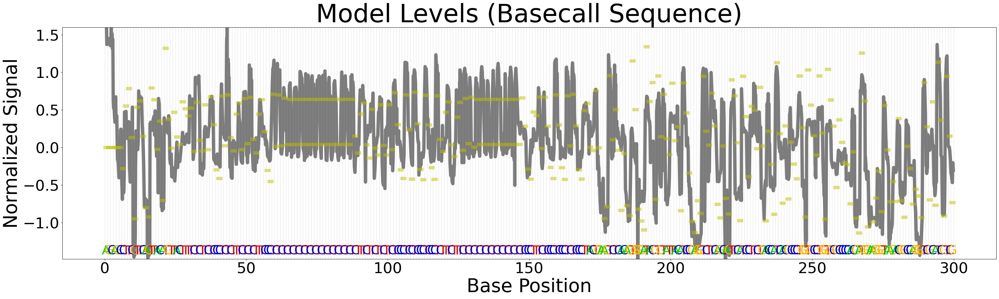

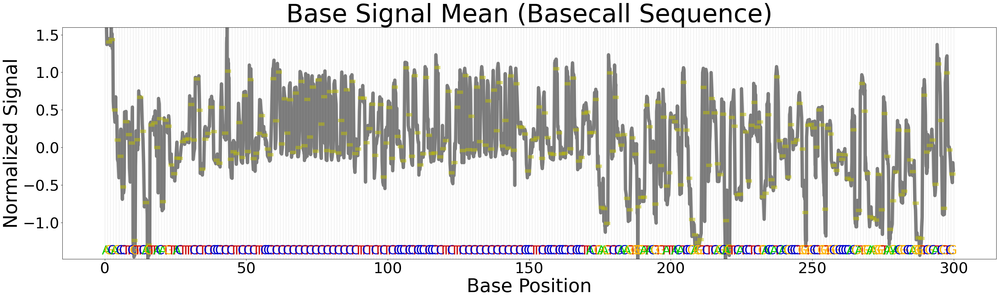

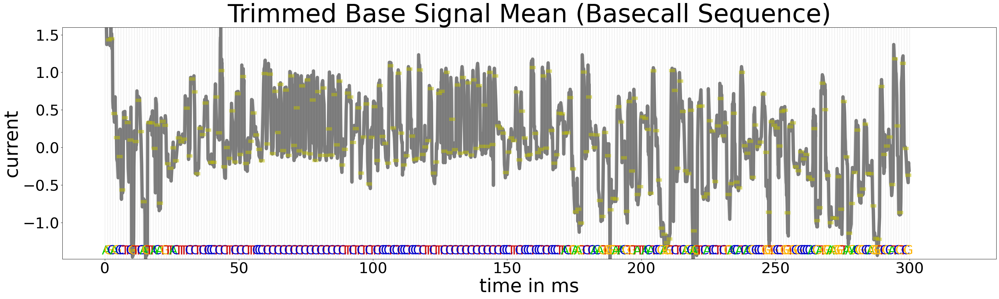

02a14200-6f17-4d5e-8a2f-885fe658a797
166
1267
error in pod5 alignment
error in pod5 alignment
RefRegion(ctg='Seq_B1', strand='+', start=0, end=306)
Read(read_id='02b1211d-f253-47bf-8220-88a1cadca353', dacs=array([577, 542, 550, ..., 617, 634, 620], dtype=int16), seq='TTAAACAAAATACTTCGTTCAGTTACGTATTGCTTTTCTCTTCTCCCTCTCTTTCTCTCTTTCCCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTTTCTTCTTCTTCTCCCTCCTCCCTCCCTCTTTCTTTCTCTCTCTCTCTCTCTCTCTCTCTCCCTTTCTCCCTCCCTCTCCCTTACTGAAGTCTCGTAAATTACGTGTATATTACATCCACGAGTCTTCATCATCCTTCTGACCATCACGCCCTGGTGCCTGGTGCGCCCACGATGGAGTAAGACGGCCCGGGTCACATCGTCGCCCGCAGGCCGGCCTTGCACATGCA', stride=5, num_trimmed=10, mv_table=array([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1,
       1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0,
       1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 

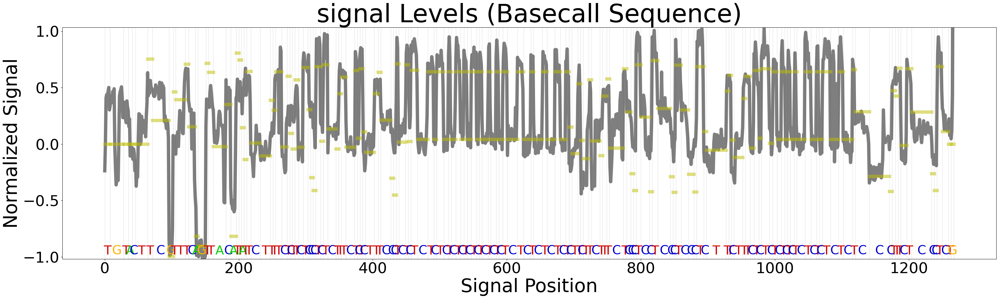

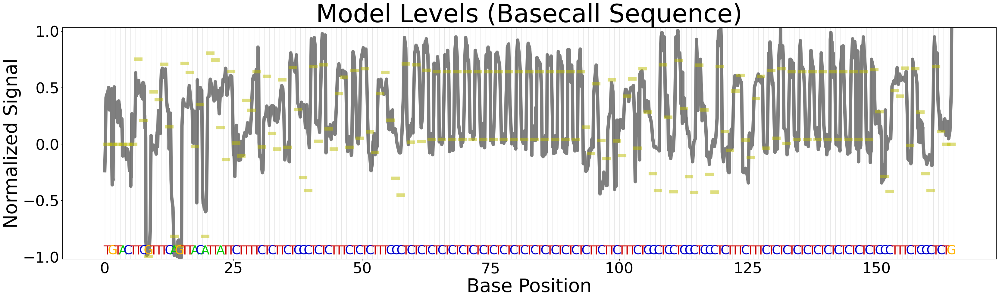

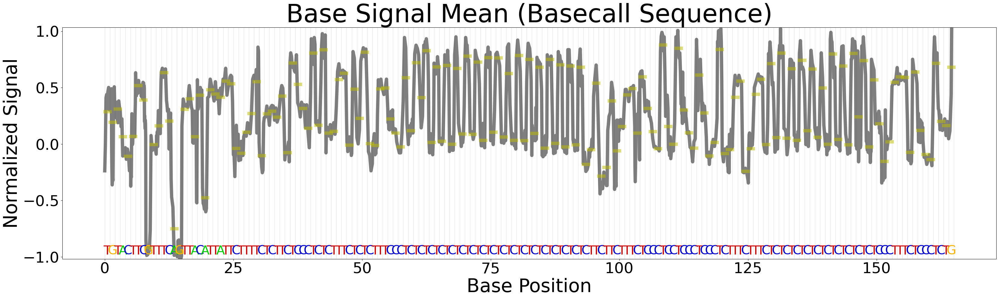

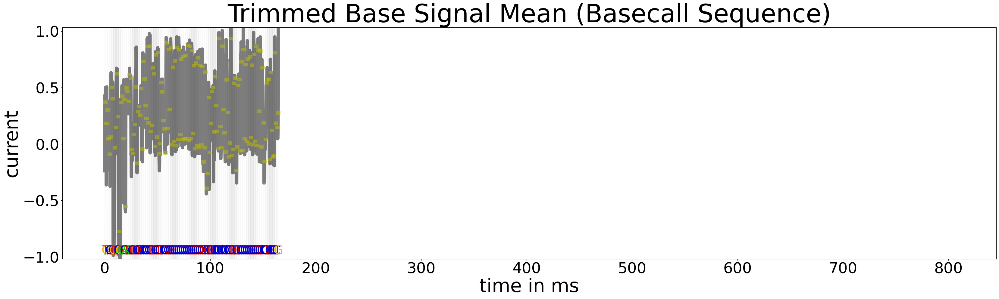

02b1211d-f253-47bf-8220-88a1cadca353
301
2880
error in pod5 alignment
error in pod5 alignment
error in pod5 alignment
RefRegion(ctg='Seq_B1', strand='+', start=0, end=190)
Read(read_id='02c4f245-eb9e-442f-bfc9-fca5b2811fcf', dacs=array([432, 442, 432, ..., 412, 411, 656], dtype=int16), seq='CTTGTATGTTACTTCAGTTCAGTTGTATTGCTTTTCTCTTCTCCCTCTCTCTCTTTCCCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTTTCCTTCTTCTTCCTCTCCCTCCCCTCTTTCTTTCTCTCTCTCTCTCTCATTCTCCCTCCCTCTCCCTTACTGAAGTCTCACGTAAATTACGTGTATATTACATCCCCAGATGTCATGCA', stride=5, num_trimmed=10, mv_table=array([1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0,
       0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1,
       0, 1, 1

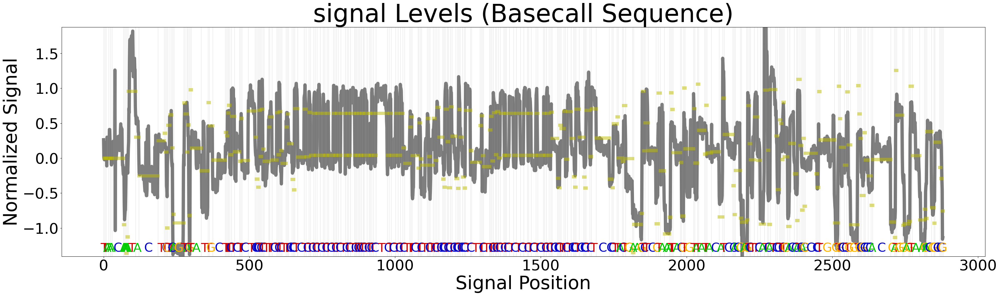

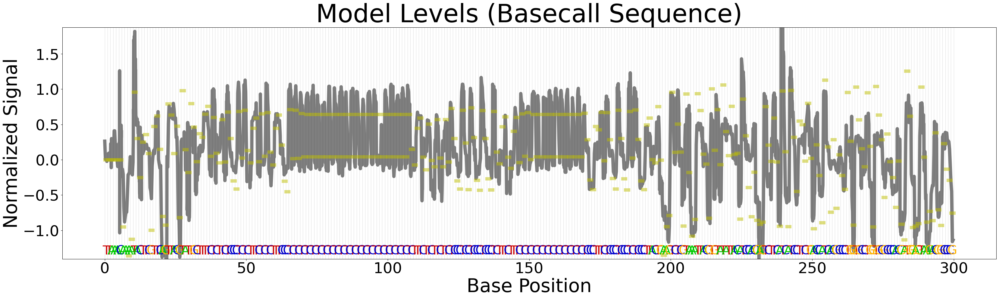

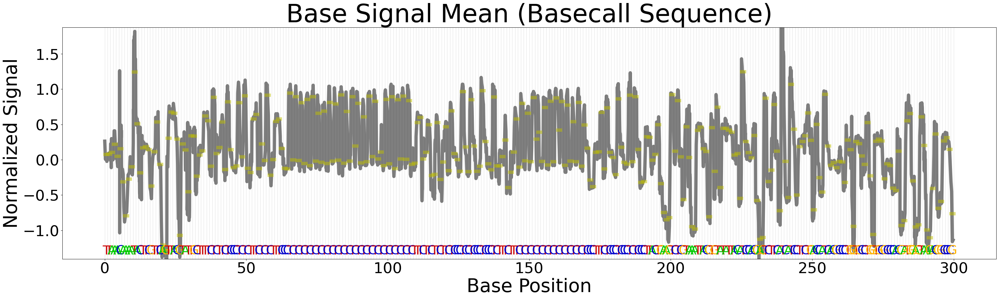

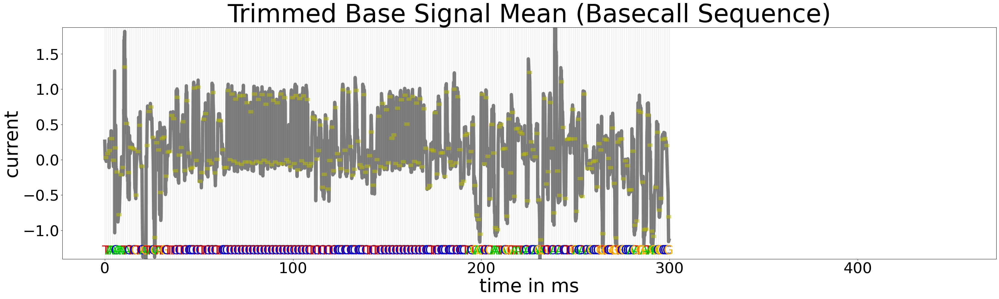

02c4f245-eb9e-442f-bfc9-fca5b2811fcf
219
1805
error in pod5 alignment
RefRegion(ctg='Seq_B1', strand='+', start=0, end=186)
Read(read_id='02e40236-4749-481a-82c0-78de095645be', dacs=array([514, 502, 538, ..., 450, 445, 428], dtype=int16), seq='GTACTTCGTTCAGTTACGTATTACTTTCTCTTCTCCCTCTCTTTCTCTCTTTCCCTCTCTATATATATATATATATATATATATATATATATGTTTCTTCTTCCTTCTCCCTCCCTCCCTCCCTCTTTCTTTATATATATATATATATATATATATAAACATACATCTCTCTCCCTTACTGAAGTCTCACGTAAATTACGTGTATATTACCT', stride=5, num_trimmed=170, mv_table=array([1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1,
       0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0,
       1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 

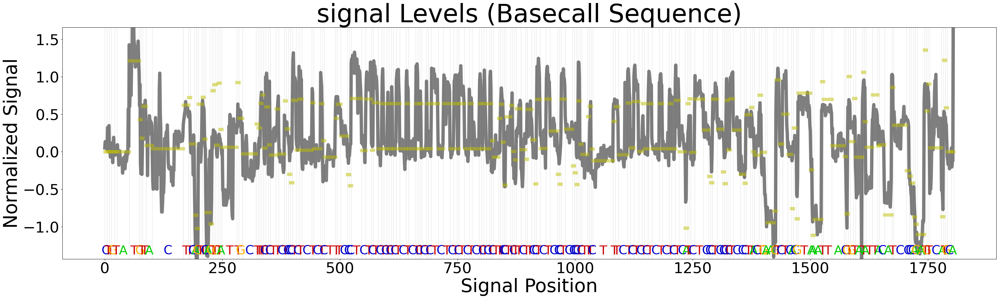

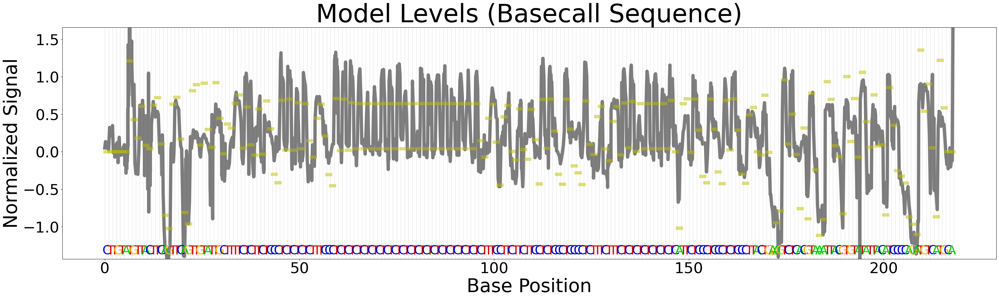

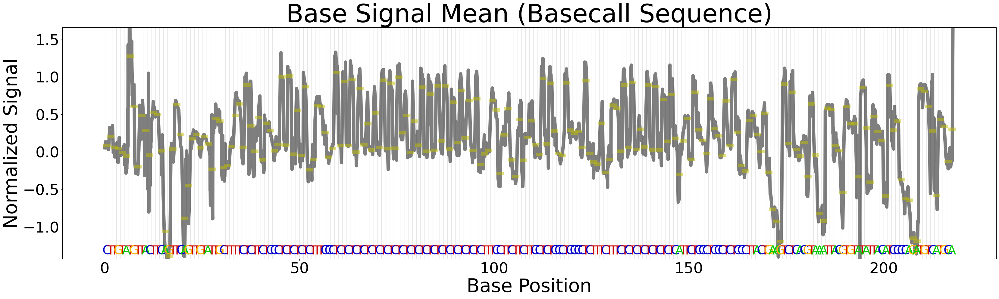

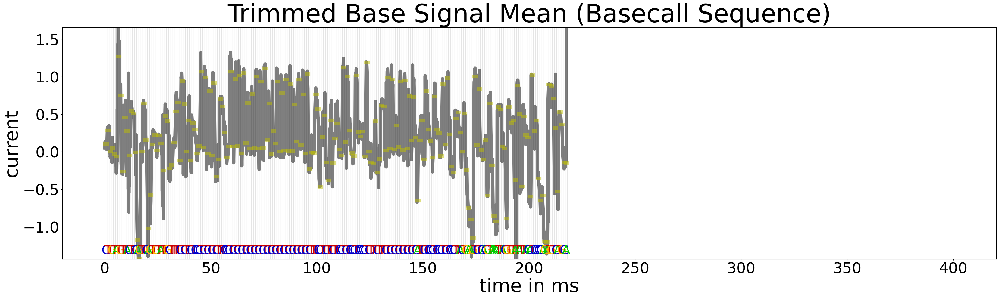

02e40236-4749-481a-82c0-78de095645be
213
1602


KeyboardInterrupt: 

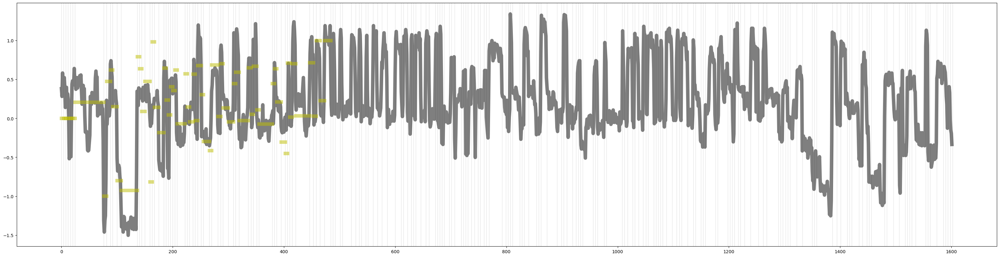

In [4]:
# try to iterate over all the reads
i = 0
for r in can_bam_fh.fetch(until_eof=True):
    if (i < 500):
        #and (io.Read.seq_len())
        #print name of read
        strR = r.to_string()
        splitR = strR.split("\t")
        #print(splitR[0]) used to print read id
        #print(r.get_reference_sequence())
        
        bam_read = r
        #print((r.get_tag("MD")))
        
        try:
            pod5_read = next(can_pod5_fh.reads(selection=[bam_read.query_name]))
            io_read = io.Read.from_pod5_and_alignment(pod5_read, bam_read) #look into this
        except:
            print("error in pod5 alignment")
            i += 1
        else:
            io_read.ref_reg
            print(io_read.ref_reg)
            print(io_read)

            io_read.set_refine_signal_mapping(sig_map_refiner, ref_mapping=False)

            model_levels = sig_map_refiner.extract_levels(util.seq_to_int(io_read.seq))
            #model_levels = sig_map_refiner.extract_levels(io_read.dacs)
            read_levels = io_read.compute_per_base_metric("dwell_mean", ref_anchored=False)["mean"]
            trim_read_levels = io_read.compute_per_base_metric(
            "dwell_trimmean", ref_anchored=False
            )["trimmean"]
            #print(len(io_read.mv_table))
            #print(len(io_read.dacs))
            
            timeSteps = []
            j = 0
            for current in io_read.dacs:
                timeSteps.append(j)
                j+=.25

            print(len(io_read.dacs))  
            print(len(timeSteps))

            plt.plot(timeSteps, io_read.dacs)
            plt.xlabel("time in ms")
            plt.ylabel("current")
            plt.show()


            start_base, end_base = 0, 300
            #start_time, end_time = 125, 300
            read_bc_reg = io_read.extract_basecall_region(start_base, end_base)
            
            
            print(read_bc_reg.read_id)
            #print(read_bc_reg.seq)
            print(len(read_bc_reg.seq_to_sig_map))
            #print(len(read_bc_reg.norm_signal))
            #print(r)
            #print(io_read.ref_reg)
            #print(io.get_ref_int_seq_from_reads(io_read.ref_reg, r))
            print(len(io.compute_base_space_sig_coords(read_bc_reg.seq_to_sig_map)))
            """
            Compute coordinates for signal points, interpolating signal assigned to
            each base linearly through the span of each covered base.
            """

            fig, ax = read_bc_reg.plot_on_signal_coords(levels=model_levels[start_base:end_base])
            _ = ax.set_title("signal Levels (Basecall Sequence)", size=60)
            fig, ax = read_bc_reg.plot_on_base_coords(levels=model_levels[start_base:end_base])
            #fig, ax = read_bc_reg.plot_on_base_coords(levels=model_levels[start_time:end_time])
            _ = ax.set_title("Model Levels (Basecall Sequence)", size=60)
            fig, ax = read_bc_reg.plot_on_base_coords(levels=read_levels[start_base:end_base])
            _ = ax.set_title("Base Signal Mean (Basecall Sequence)", size=60)
            fig, ax = read_bc_reg.plot_on_base_coords(levels=trim_read_levels[start_base:end_base])
            _ = ax.set_title("Trimmed Base Signal Mean (Basecall Sequence)", size=60)
            i+=1
            
            # input data into a pandas data frame format
            #data_dict = {'read_ID':read_bc_reg.read_id, 'kmer':kmer_list, 'values': io_read.dacs, 'bases':io_read.seq, 'mean_vals':mean_vals}
            #data_all_1 = pd.DataFrame(data=data_dict)
    else:
        break

In [11]:
bam_read = next(can_bam_fh)
pod5_read = next(can_pod5_fh.reads(selection=[bam_read.query_name]))

try:
    io_read = io.Read.from_pod5_and_alignment(pod5_read, bam_read) #look into this
except:
     print("error in pod5 alignment")
else:
    print(io_read.read_id)
    print(io_read.ref_reg.ctg)
    print(io_read.ref_reg.strand)
    print(io_read.ref_reg)
    print(io_read.seq)
    print(len(io_read.seq))
    #print(io_read.ref_reg.parse_ref_region_str(io_read.ref_reg.strand, req_strand=True))

02fe59d2-7079-43b1-b88e-c1d65d66030a
Seq_B1
+
RefRegion(ctg='Seq_B1', strand='+', start=0, end=178)
TATGCTTCCGTTCAGTTACATTATTGCTTTTCTCCTTCTCCCTCTCTTTCTCTCTTTCCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTCTTTCTTTCTTCTTCTTCTCCCTCCTCCCTCCCTCTTTCTTTCTCTCTCTCTCTCTCTCTCTCCCTTTCTCCCTCCCTCTCCCTGCACAAAATCTCACATAAATTACGTGCTCATACATCCCACAGGAATCTACCT
226


## Preprocesses Function

In [12]:
def get_sample_name(barcode):
    if (barcode == "Seq_B1"):
        return 0
    elif (barcode == "Seq_B7"):
        return 1
    elif (barcode == "Seq_B9"):
        return 2
    elif (barcode == "Seq_B11"):
        return 3
    else:
        return 4

In [13]:
def preprocess_fast5(barcode):
    # try to iterate over all the reads
    i = 0
    readID_list = []
    kmer_list = []
    signal_list = []
    bases=[]
    mean_vals=[]
    all_matches=[]
    
    for r in can_bam_fh.fetch(until_eof=True):
        if (i < 50000):
            #and (io.Read.seq_len())
            #print name of read
            strR = r.to_string()
            splitR = strR.split("\t")
            #print(splitR[0]) used to print read id
            #print(r.get_reference_sequence())

            bam_read = r
            #print((r.get_tag("MD")))
            
            try:
                pod5_read = next(can_pod5_fh.reads(selection=[bam_read.query_name]))
                io_read = io.Read.from_pod5_and_alignment(pod5_read, bam_read) #look into this
            except:
                #print("error in pod5 alignment")
                i += 1
            else:
                io_read.ref_reg
                #print(io_read.ref_reg)
                #print(io_read)

                io_read.set_refine_signal_mapping(sig_map_refiner, ref_mapping=False)

                model_levels = sig_map_refiner.extract_levels(util.seq_to_int(io_read.seq))
                #model_levels = sig_map_refiner.extract_levels(io_read.dacs)
                read_levels = io_read.compute_per_base_metric("dwell_mean", ref_anchored=False)["mean"]
                trim_read_levels = io_read.compute_per_base_metric(
                "dwell_trimmean", ref_anchored=False
                )["trimmean"]

                start_base, end_base = 0, 300 # want to extract a specific region from the bases
                read_bc_reg = io_read.extract_basecall_region(start_base, end_base)
                
                print(io_read.ref_reg.ctg)
                #print(io_read.ref_reg.ctg == barcode)
                if (io_read.ref_reg.ctg == barcode):
                    readID_list.append(read_bc_reg.read_id)
                    signal_list.append(io_read.dacs)
                    bases.append(io_read.seq)
                    kmer_list.append(get_sample_name(barcode))
                    
                i+=1
                

        else:
            break
            
    # input data into a pandas data frame format
    data_dict = {'read_ID':readID_list, 'kmer':kmer_list, 'values': signal_list, 'bases':bases}
    print(len(signal_list))
    data_all_1 = pd.DataFrame(data=data_dict)
    return data_all_1

In [14]:
data_0 = preprocess_fast5('Seq_B1') #9A
#data_1 = preprocess_fast5(input_file,sample_name_1,'Seq_B3') #9D
data_1 = preprocess_fast5('Seq_B7') #9E
data_2 = preprocess_fast5('Seq_B9') #9F
data_3 = preprocess_fast5('Seq_B11') #9G
data_4 = preprocess_fast5('Seq_B13') #9W

Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1

Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1

Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1

Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1

Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1

Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1

Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1
Seq_B1

Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3

Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3
Seq_B3

Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7

Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7

Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7

Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7

Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
5523
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
S

Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7

Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7
Seq_B7

Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9

Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9

Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9

Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9

Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9
Seq_B9

Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11


Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11


Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11


Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11


Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11


Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11
Seq_B11


Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13


Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13


Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13


Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13


Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13


Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13
Seq_B13


None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


In [15]:
############### sampling the data based on the specified sample size

# updated 6/16
sample_size=np.min([data_0.shape[0],data_1.shape[0],data_2.shape[0],data_3.shape[0],data_4.shape[0]])

data_0i = data_0.sample(min(len(data_0),sample_size))
#data_1i = data_1.sample(min(len(data_1),sample_size))
data_1i = data_1.sample(min(len(data_1),sample_size))
data_2i = data_2.sample(min(len(data_2),sample_size))
data_3i = data_3.sample(min(len(data_3),sample_size))
data_4i = data_4.sample(min(len(data_4),sample_size))



#data_all_2 = data_0i.append(data_2i)

#data_all_3=data_all_2.append(data_3i)
#data_all_4=data_all_3.append(data_4i)
#data_all=data_all_4.append(data_5i)
#data_all=data_all.reset_index()

data_all_2=pd.concat([data_0i, data_1i])

data_all_3=pd.concat([data_all_2, data_2i])

data_all_4=pd.concat([data_all_3, data_3i])

data_all=pd.concat([data_all_4, data_4i])

data_all=data_all.reset_index()

In [16]:
## Save PD as pkl
pickle_fname= "./data_all_r9.pkl"
data_all.to_pickle(pickle_fname)

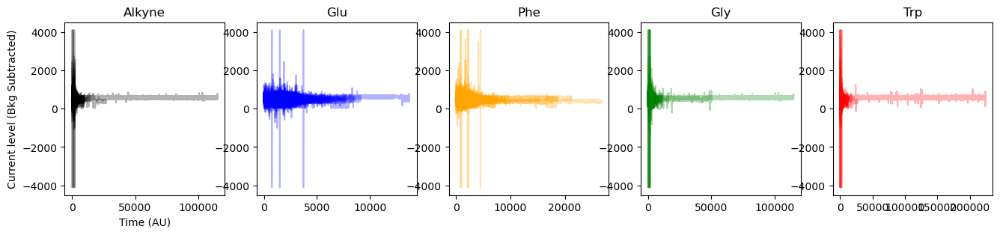

In [17]:
fig, axs= plt.subplots(1,5,figsize=(16,3))
i = 0;

for sig in data_0i['values']:
    #print(sig.shape)
        axs[0].plot(sig,color= "black", alpha= 0.3)

for sig in data_1i['values']:
    axs[1].plot(sig,color= "blue", alpha= 0.3)
    
for sig in data_2i['values']:
    axs[2].plot(sig,color= "orange", alpha= 0.3)
    
for sig in data_3i['values']:
    axs[3].plot(sig,color= "green", alpha= 0.3)
    
for sig in data_4i['values']:
    axs[4].plot(sig,color= "red", alpha= 0.3)
    

"""
axs[0].set(xlim=(0, 300))
axs[1].set(xlim=(0, 300))
axs[2].set(xlim=(0, 300))
axs[3].set(xlim=(0, 300))
axs[4].set(xlim=(0, 300))

axs[0].set(ylim=(0, 700))
axs[1].set(ylim=(0, 700))
axs[2].set(ylim=(0, 700))
axs[3].set(ylim=(0, 700))
axs[4].set(ylim=(0, 700))
"""

axs[0].set_title('Alkyne')
axs[1].set_title('Glu')
axs[2].set_title('Phe')
axs[3].set_title('Gly')
axs[4].set_title('Trp')

axs[0].set_ylabel('Current level (Bkg Subtracted)')
axs[0].set_xlabel('Time (AU)')

plt.show()

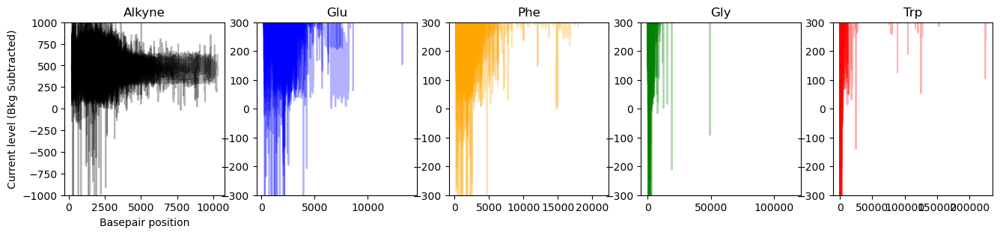

In [121]:
fig, axs= plt.subplots(1,5,figsize=(16,3))


start=225

    

for sig in data_0i['values']:
    axs[0].plot(np.arange(start,start+len(sig)),sig,color= "black", alpha= 0.3)
    
for sig in data_1i['values']:
    axs[1].plot(np.arange(start,start+len(sig)),sig,color= "blue", alpha= 0.3)
    
for sig in data_2i['values']:
    axs[2].plot(np.arange(start,start+len(sig)),sig,color= "orange", alpha= 0.3)
    
for sig in data_3i['values']:
    axs[3].plot(np.arange(start,start+len(sig)),sig,color= "green", alpha= 0.3)
    
for sig in data_4i['values']:
    axs[4].plot(np.arange(start,start+len(sig)),sig,color= "red", alpha= 0.3)
    

    
#axs[0].set(xlim=(0, 500))
#axs[1].set(xlim=(0, 500))
#axs[2].set(xlim=(0, 500))

#axs[0].set(ylim=(-6, 4))
#axs[1].set(ylim=(-6, 4))
#axs[2].set(ylim=(-6, 4))
#axs[3].set(ylim=(-6, 4))
#axs[4].set(ylim=(-6, 4))

axs[0].set(ylim=(-1000, 1000))
axs[1].set(ylim=(-300, 300))
axs[2].set(ylim=(-300, 300))
axs[3].set(ylim=(-300, 300))
axs[4].set(ylim=(-300, 300))


axs[0].set_title('Alkyne')
axs[1].set_title('Glu')
axs[2].set_title('Phe')
axs[3].set_title('Gly')
axs[4].set_title('Trp')

axs[0].set_ylabel('Current level (Bkg Subtracted)')
axs[0].set_xlabel('Basepair position')





plt.show()

#print(data_10_mean.shape)

## Next Part

In [115]:
io_read.set_refine_signal_mapping(sig_map_refiner, ref_mapping=False)

model_levels = sig_map_refiner.extract_levels(util.seq_to_int(io_read.seq))
read_levels = io_read.compute_per_base_metric("dwell_mean", ref_anchored=False)["mean"]
trim_read_levels = io_read.compute_per_base_metric(
    "dwell_trimmean", ref_anchored=False
)["trimmean"]

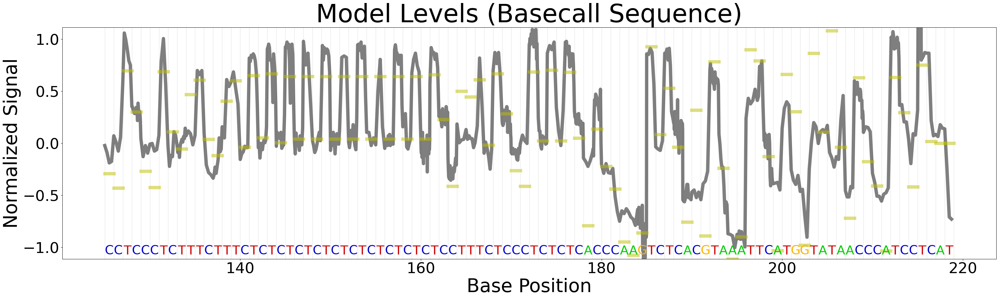

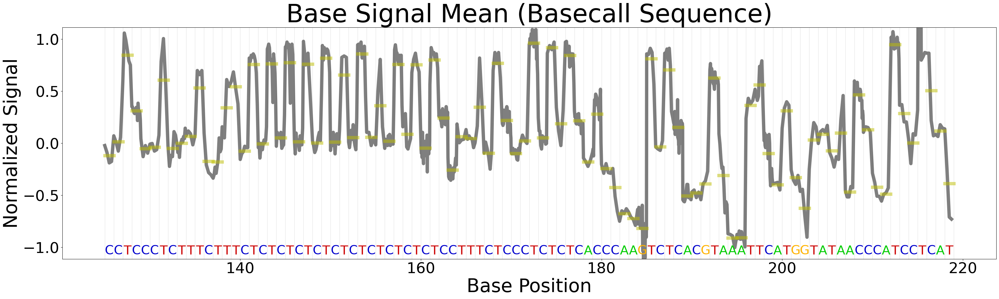

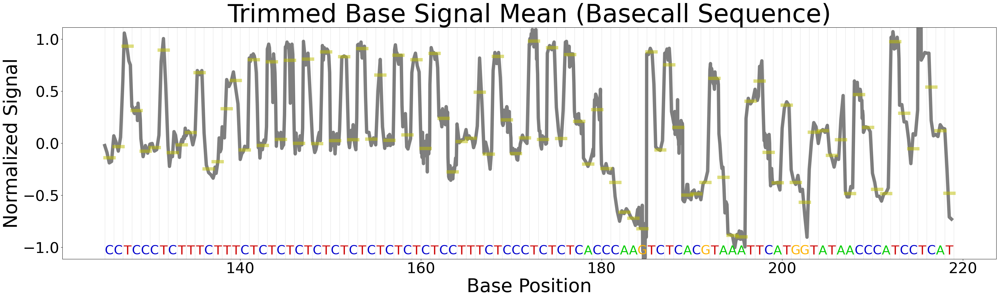

In [79]:
start_base, end_base = 125, 300
read_bc_reg = io_read.extract_basecall_region(start_base, end_base)

fig, ax = read_bc_reg.plot_on_base_coords(levels=model_levels[start_base:end_base])
_ = ax.set_title("Model Levels (Basecall Sequence)", size=60)
fig, ax = read_bc_reg.plot_on_base_coords(levels=read_levels[start_base:end_base])
_ = ax.set_title("Base Signal Mean (Basecall Sequence)", size=60)
fig, ax = read_bc_reg.plot_on_base_coords(levels=trim_read_levels[start_base:end_base])
_ = ax.set_title("Trimmed Base Signal Mean (Basecall Sequence)", size=60)

### Plot Dwell and SD Metrics

In [55]:
read_bc_reg = io_read.extract_basecall_region(start_base, end_base)
read_metrics = io_read.compute_per_base_metric(
    "dwell_trimmean_trimsd", ref_anchored=False
)

ValueError: x and y must have same first dimension, but have shapes (95,) and (94,)

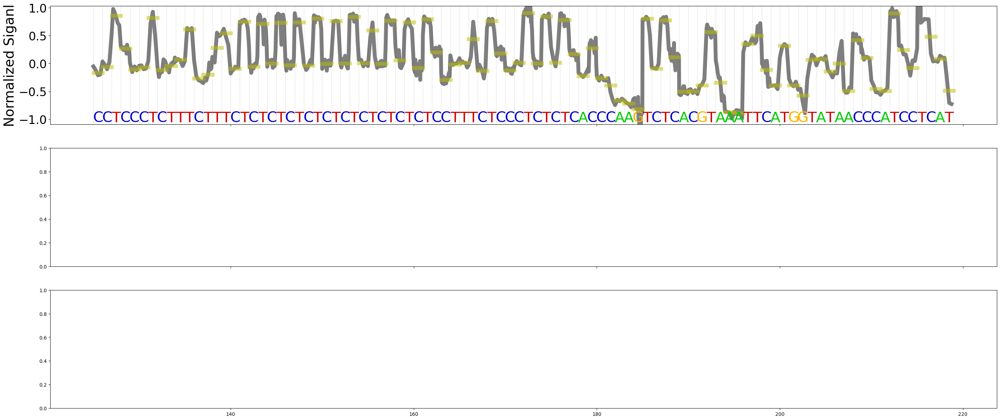

In [56]:
fig, (ax1, ax2, ax3) = plt.subplots(
    len(read_metrics), sharex=True, figsize=(35, 5 * len(read_metrics))
)
_ = read_bc_reg.plot_on_base_coords(
    levels=read_metrics["trimmean"][start_base:end_base], fig_ax=(fig, ax1)
)
ax1.set_xlabel("")
ax1.set_ylabel("Normalized Siganl", fontsize=28)
ax1.tick_params(labelsize=24)
_ = ax2.plot(
    np.arange(start_base, end_base) + 0.5,
    read_metrics["dwell"][start_base:end_base],
    ".",
    markersize=20,
)
ax2.set_ylabel("Dwell\n(num signal points)", fontsize=28)
ax2.tick_params(labelsize=24)
_ = ax3.plot(
    np.arange(start_base, end_base) + 0.5,
    read_metrics["trimsd"][start_base:end_base],
    ".",
    markersize=20,
)
ax3.set_ylabel("Trim SD", fontsize=28)
ax3.tick_params(labelsize=24)
_ = ax3.set_xlabel("Base Position", fontsize=45)
plt.tight_layout()

### Reference-anchored Metrics

#### Single Read Plotting

In [43]:
# example read is reverese strand
ref_reg = io.RefRegion(
    ctg=io_read.ref_reg.ctg,
    strand=io_read.ref_reg.strand,
    start=52_309_400,
    end=52_309_500,
)

io_read.set_refine_signal_mapping(sig_map_refiner, ref_mapping=False)

_, model_levels = io.get_ref_seq_and_levels_from_reads(
    ref_reg, [bam_read], sig_map_refiner, ref_orient=False
)
read_means = io_read.compute_per_base_metric(
    "dwell_mean", ref_anchored=True, region=ref_reg
)["mean"][::-1]
read_trim_means = io_read.compute_per_base_metric(
    "dwell_trimmean", ref_anchored=True, region=ref_reg
)["trimmean"][::-1]

read_ref_reg = io_read.extract_ref_reg(ref_reg)
_ = read_ref_reg.plot_on_base_coords(levels=model_levels)
_ = read_ref_reg.plot_on_base_coords(levels=read_means)
_ = read_ref_reg.plot_on_base_coords(levels=read_trim_means)

ValueError: MD tag not present

### Multiple Reads at Reference Region

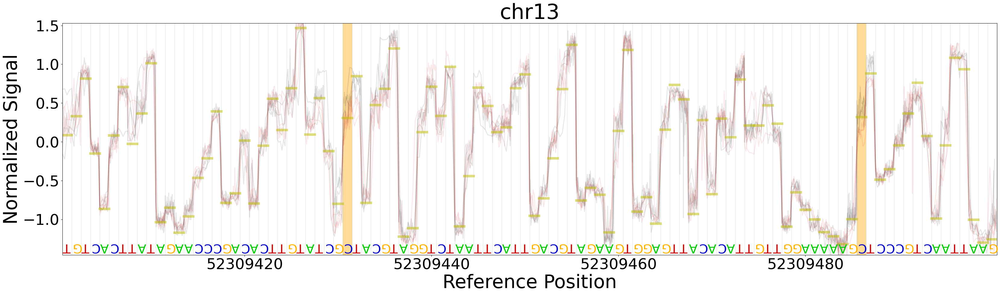

In [14]:
ref_reg = io.RefRegion(ctg="chr13", strand="-", start=52_309_400, end=52_309_500)
ref_seq = io.get_ref_seq_from_reads(ref_reg, io.get_reg_bam_reads(ref_reg, can_bam_fh))
cg_locs = np.array([ref_reg.start + m.start() + 1 for m in re.finditer("GC", ref_seq)])
# cg_locs = np.array([ref_reg.start + m.start() for m in re.finditer("CG", ref_seq)])
# standard signal reference region plot
ax = io.plot_signal_at_ref_region(
    ref_reg,
    [(can_pod5_fh, can_bam_fh), (mod_pod5_fh, mod_bam_fh)],
    sig_map_refiner,
    highlight_ranges=[(loc, loc + 1, "orange") for loc in cg_locs],
)

In [15]:
samples_metrics, all_bam_reads = io.get_ref_reg_samples_metrics(
    ref_reg,
    [(can_pod5_fh, can_bam_fh), (mod_pod5_fh, mod_bam_fh)],
    metric="dwell_trimmean_trimsd",
    sig_map_refiner=sig_map_refiner,
    max_reads=1_000,
)
list(samples_metrics[0].keys())

['dwell', 'trimmean', 'trimsd']

In [16]:
# 4 reads, by 100 reference bases
# samples_metrics contains one item for each input sample
# each sample contains a dictionary with metric names pointing to numpy arrays
samples_metrics[0]["trimmean"].shape

(4, 100)

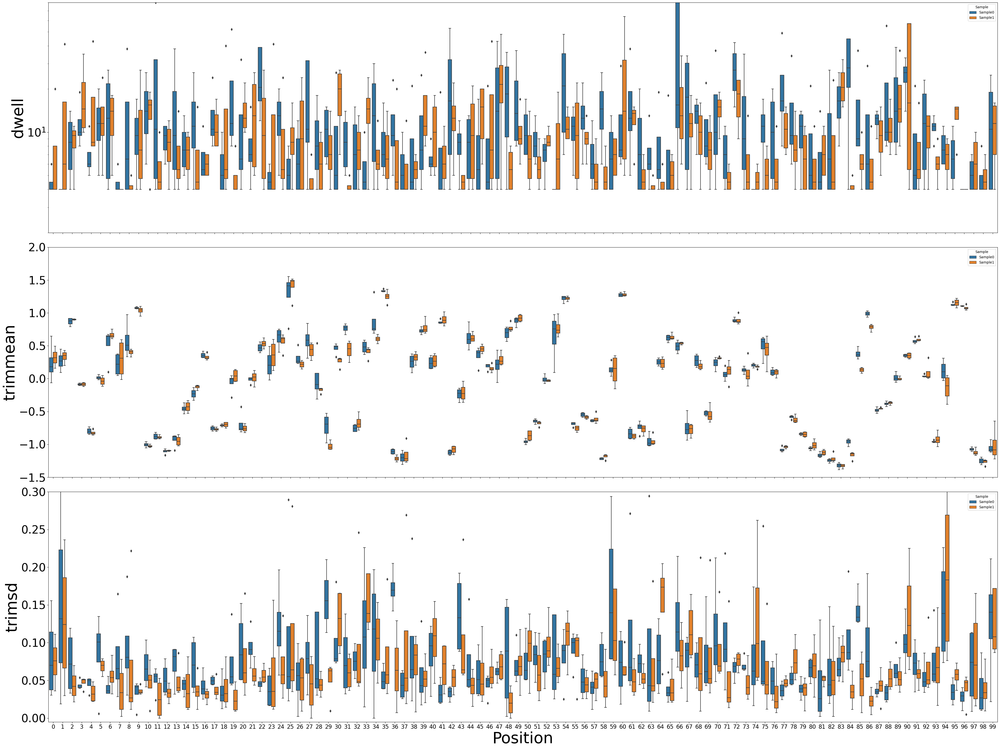

In [17]:
axs = io.plot_metric_at_ref_region(
    ref_reg,
    [(can_pod5_fh, can_bam_fh), (mod_pod5_fh, mod_bam_fh)],
    sig_map_refiner=sig_map_refiner,
    metric="dwell_trimmean_trimsd",
)

### T-test p-values

In [18]:
def nan_ttest(s1, s2):
    return -np.log10(ttest_ind(s1[~np.isnan(s1)], s2[~np.isnan(s2)]).pvalue)

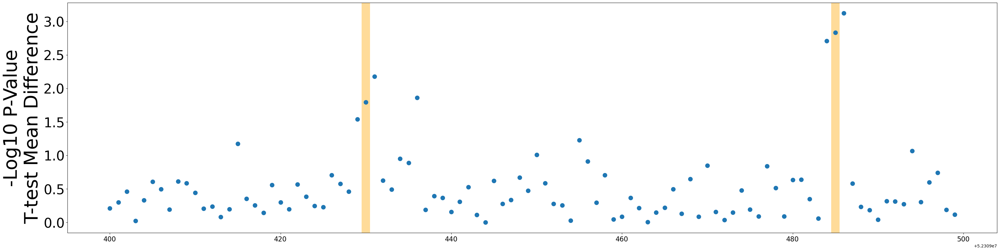

In [19]:
fig, ax = plt.subplots(figsize=(40, 10))

for st in cg_locs:
    ax.axvspan(st - 0.5, st + 0.5, facecolor="orange", alpha=0.4)
_ = ax.plot(
    ref_reg.coord_range,
    [
        nan_ttest(
            samples_metrics[0]["trimmean"][:, idx],
            samples_metrics[1]["trimmean"][:, idx],
        )
        for idx in range(ref_reg.len)
    ],
    ".",
    markersize=20,
)
_ = ax.set_ylabel("-Log10 P-Value\nT-test Mean Difference", fontsize=45)
ax.tick_params(labelsize=16, axis="x")
ax.tick_params(labelsize=32, axis="y")